# Installs and imports

In [ ]:
!pip install open3d

In [1]:
import numpy as np
import pandas as pd
import shutil
import os
import random
import torch
from matplotlib import pyplot as plt
import open3d as o3d
import os

# Choosing the data location

In [3]:
# import your Google Drive, assuming your data is stored there

import os
from google.colab import drive
drive.mount('/content/drive')
drive_folder = '/content/drive/MyDrive'

Mounted at /content/drive


In [2]:
raw_data_location = "/content/drive/MyDrive/MRes/Data/viz/"
viz_data_location = "/content/drive/MyDrive/MRes/Data/viz/"

subplot_num = 0
plot_num = 48

full_data = np.load(raw_data_location + f"plot{plot_num}_annotated_{subplot_num}.npy")
data_plot = np.load(raw_data_location + f"plot{plot_num}_annotated_{subplot_num}.npy")

plot_full_res_coords = np.load(viz_data_location + f"plot{plot_num}_annotated.las_{subplot_num}.txt_full_res_coords.npy")
plot_sort_classes = np.load(viz_data_location + f"plot{plot_num}_annotated.las_{subplot_num}.txt_sort_classes.npy")
plot_sorted_masks = np.load(viz_data_location + f"plot{plot_num}_annotated.las_{subplot_num}.txt_sorted_masks.npy")

# Plots

Ground truth masks, downsampled to show 10% of points

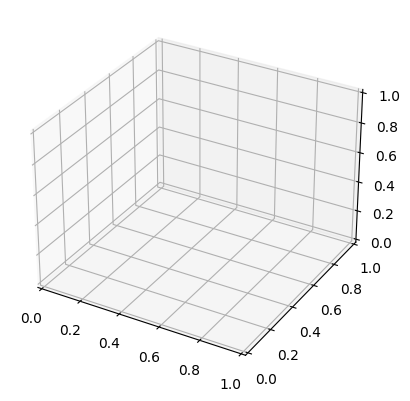

In [7]:
#%% full plot with point cloud mask
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

tree_data = full_data

xyz = tree_data[:,0:3]

colors = tree_data[:, 11]

# Get unique values in the array
unique_colors = np.unique(colors)

# Generate colormap with unique RGB values
np.random.seed(0)
colormap = np.random.randint(0, 256, size=(len(unique_colors), 3))

# Create a dictionary to map each unique value to its corresponding RGB color
color_mapping = dict(zip(unique_colors, colormap))

# Convert the original array of values to RGB using the colormap
colors = np.array([color_mapping[color] for color in colors])

normed_colors = (colors-np.min(colors))/(np.max(colors)-np.min(colors))

pcd = o3d.geometry.PointCloud()
pcd.points = o3d.utility.Vector3dVector(xyz)
pcd.colors = o3d.utility.Vector3dVector(normed_colors)

o3d.visualization.draw_plotly([pcd], point_sample_factor = 0.1)


Same as above but with voxels. This doesn't work on Colab, unfortunately!

In [ ]:
tree_data = full_data

xyz = tree_data[:,0:3]

colors = tree_data[:, 11]

# Get unique values in the array
unique_colors = np.unique(colors)

# Generate colormap with unique RGB values
np.random.seed(0)
colormap = np.random.randint(0, 256, size=(len(unique_colors), 3))

# Create a dictionary to map each unique value to its corresponding RGB color
color_mapping = dict(zip(unique_colors, colormap))

# Convert the original array of values to RGB using the colormap
colors = np.array([color_mapping[color] for color in colors])

normed_colors = (colors-np.min(colors))/(np.max(colors)-np.min(colors))

pcd = o3d.geometry.PointCloud()
pcd.points = o3d.utility.Vector3dVector(xyz)
pcd.colors = o3d.utility.Vector3dVector(normed_colors)

#pcd.scale(1 / np.max(pcd.get_max_bound() - pcd.get_min_bound()), center=pcd.get_center())

voxel_grid = o3d.geometry.VoxelGrid.create_from_point_cloud(pcd,
                                                            voxel_size=8.0)

o3d.visualization.draw_plotly([voxel_grid])

Plot the predicted instances for the testing point cloud

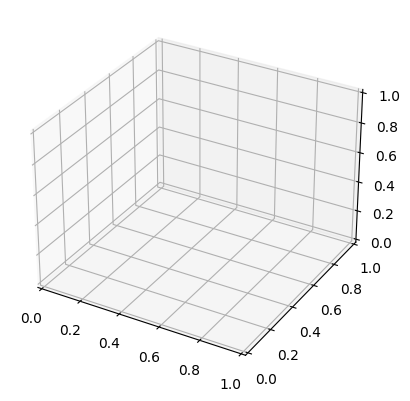

In [5]:
#%% full plot with predicted point cloud mask
import colorsys
from itertools import product, combinations
from matplotlib.ticker import MaxNLocator
from matplotlib.widgets import CheckButtons

pred_coords = []
pred_normals = []
pred_sem_color = []
pred_inst_color = []

for did in range(len(plot_sorted_masks)):

    for i in reversed(range(plot_sorted_masks[did].shape[1])):
        coords = plot_full_res_coords[plot_sorted_masks[did][:, i].astype(bool)]

        mask_coords = plot_full_res_coords[plot_sorted_masks[did][:,i].astype(bool)]

        label = plot_sort_classes[did][i]

        if len(mask_coords) == 0:
            continue

        pred_coords.append(mask_coords)

# get unique instance masks
unique_pred_coords = []

for arr in pred_coords:
    if not any(np.array_equal(arr, unique_arr) for unique_arr in unique_pred_coords):
        unique_pred_coords.append(arr)

pred_coords = unique_pred_coords

# filter out arrays that are subsets of other arrays
filtered_pred_coords = []

for i, array in enumerate(pred_coords):
    is_subset = False
    for j, other_array in enumerate(pred_coords):
        if i != j and array.shape[0] <= other_array.shape[0]:
            if np.array_equal(array, other_array[:array.shape[0]]):
                is_subset = True
                break
    if not is_subset:
        filtered_pred_coords.append(array)

pred_coords = filtered_pred_coords

# sort instance masks by size
pred_coords = sorted(pred_coords, key=lambda x: x.shape[0], reverse=True)

pred_coords_subset = pred_coords
use_rgb = False
full_rgb = False
use_gt_masks = False
gt_mask_legend = False
predicted_mask_legend = False
seed = 0

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

colors = [np.full(len(arr), i) for i, arr in enumerate(pred_coords_subset)]

xyz_list = []
color_list = []

# Combine XYZ arrays and colors into separate lists
for xyz, color in zip(pred_coords_subset, colors):
    xyz_list.append(xyz)
    color_list.append(color)

# Concatenate XYZ arrays and colors into single numpy arrays
xyz = np.concatenate(xyz_list)
colors = np.concatenate(color_list)

# Get unique values in the colors array
unique_colors = np.unique(colors)

# Generate colormap with unique RGB values
np.random.seed(seed)
colormap = np.random.randint(0, 256, size=(len(unique_colors), 3))

# Create a dictionary to map each unique value to its corresponding RGB color
color_mapping = dict(zip(unique_colors, colormap))

# Convert the original array of values to RGB using the colormap
converted_colors = np.array([color_mapping[color] for color in colors])

if use_rgb:
    if full_rgb:
        xyz_full = full_data[:, 0:3]
        rgb_full = full_data[:, 3:6]
    else:
        # use RGB color instead
        full_df = pd.DataFrame(full_data[:, :6], columns=['x', 'y', 'z', 'R', 'G', 'B'])
        pred_df = pd.DataFrame(pred_coords_subset[0], columns=['x', 'y', 'z'])

        merged_df = pd.merge(full_df, pred_df, on=['x', 'y', 'z'], how='inner')
        merged_np = merged_df.values
        xyz = merged_np[:, 0:3]
        converted_colors = merged_np[:, 3:6]

if use_gt_masks:
    # use ground truth masks colors
    full_df = pd.DataFrame(full_data[:, :3], columns=['x', 'y', 'z'])
    full_df["treeID"] = full_data[:, 11]
    pred_df = pd.DataFrame(pred_coords_subset[0], columns=['x', 'y', 'z'])

    merged_df = pd.merge(full_df, pred_df, on=['x', 'y', 'z'], how='inner')
    merged_np = merged_df.values
    xyz = merged_np[:, 0:3]
    colors = merged_np[:, 3]

    # Get unique values in the colors array
    unique_colors = np.unique(colors)

    # Generate colormap with unique RGB values
    np.random.seed(seed)
    colormap = np.random.randint(0, 256, size=(len(unique_colors), 3))

    # Create a dictionary to map each unique value to its corresponding RGB color
    color_mapping = dict(zip(unique_colors, colormap))

    # Convert the original array of values to RGB using the colormap
    converted_colors = np.array([color_mapping[color] for color in colors])





if gt_mask_legend:
    # Create Open3D point cloud
    pcd = o3d.geometry.PointCloud()
    pcd.points = o3d.utility.Vector3dVector(xyz)
    pcd.colors = o3d.utility.Vector3dVector(converted_colors / 255.0)  # Normalize colors to [0, 1]

    # Convert Open3D point cloud to a numpy array
    points = np.asarray(pcd.points)
    colors = np.asarray(pcd.colors)

    # Create a scatter plot using Matplotlib
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')
    #ax.scatter(points[:, 0], points[:, 1], points[:, 2], c=colors, s=10, alpha=0.8)

    # Create unique color entries for the legend
    unique_colors = np.unique(converted_colors, axis=0)  # Get unique RGB values
    legend_labels = ['Ground Truth Tree ' + str(i+1) for i in range(len(unique_colors))]

    # Plot a dummy point for each unique color to create the legend
    for color, label in zip(unique_colors / 255.0, legend_labels):
        ax.scatter([], [], [], c=[color], label=label)

    # Add legend with non-translucent background
    legend = ax.legend(framealpha=1)

    # Set the color of the legend background
    legend.get_frame().set_facecolor('white')


    # Show the plot
    plt.show()

if predicted_mask_legend:
    # Create unique color entries for the legend
    unique_colors = np.unique(converted_colors, axis=0)  # Get unique RGB values
    legend_labels = ['Predicted Tree ' + str(i+1) for i in range(len(unique_colors))]

    # Plot a dummy point for each unique color to create the legend
    for color, label in zip(unique_colors / 255.0, legend_labels):
        ax.scatter([], [], [], c=[color], label=label)

    # Add legend with non-translucent background
    legend = ax.legend(framealpha=1)

    # Set the color of the legend background
    legend.get_frame().set_facecolor('white')


    # Show the plot
    plt.show()



if full_rgb:
    full_pcd = o3d.geometry.PointCloud()
    full_pcd.points = o3d.utility.Vector3dVector(xyz_full)
    full_pcd.colors = o3d.utility.Vector3dVector(rgb_full / 255.0)

    # Visualize the point cloud


    o3d.visualization.draw_plotly([pcd, full_pcd, pcd], point_sample_factor = 0.1)

else:
    # Visualize the point cloud
    pcd = o3d.geometry.PointCloud()
    pcd.points = o3d.utility.Vector3dVector(xyz)
    pcd.colors = o3d.utility.Vector3dVector(converted_colors / 255.0)

    o3d.visualization.draw_plotly([pcd], point_sample_factor = 0.1)